In [1]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="GZQJhkzwfnVCnfRzRhJf")
project = rf.workspace("bryan-b56jm").project("tomato-leaf-disease-ssoha")
version = project.version(63)
dataset = version.download("yolov11")
                

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.3/85.3 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 24.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 87.6 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sigstore 3.6.1 requires rich~=13.0, but you have rich 14.0.0 which is incompatible.
datasets 3.5.0 requires fsspec[http]<=2024.12.0,>=2023.1.0, 


Extracting Dataset Version Zip to Tomato-Leaf-Disease-63 in yolov11:: 100%|██████████| 20106/20106 [00:02<00:00, 7935.61it/s]


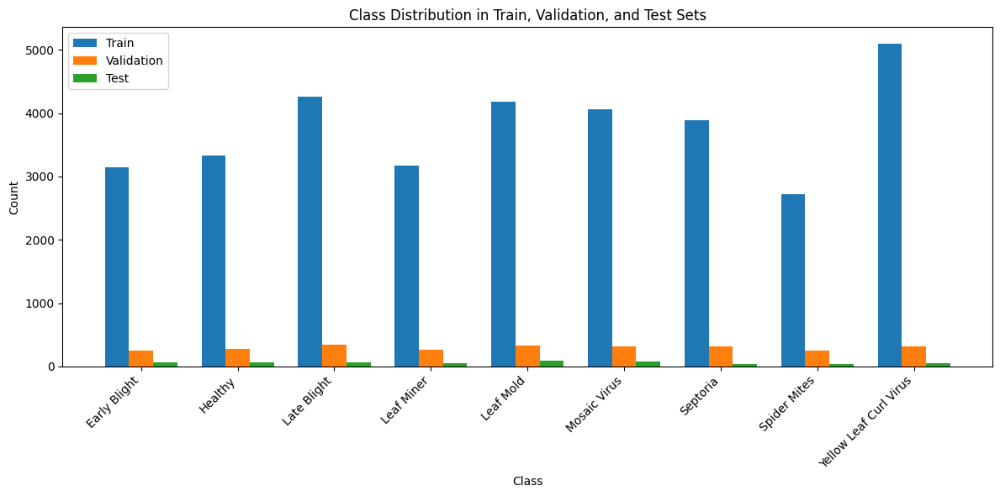

In [2]:
import os
from collections import Counter
import matplotlib.pyplot as plt

# Updated class names (9 classes)
class_names = [
    'Early Blight', 'Healthy', 'Late Blight', 'Leaf Miner', 
    'Leaf Mold', 'Mosaic Virus', 'Septoria', 'Spider Mites', 'Yellow Leaf Curl Virus'
]

def count_classes(label_path):
    counts = Counter()
    if not os.path.exists(label_path):
        return counts  # return empty if no such folder
    for file in os.listdir(label_path):
        if file.endswith('.txt'):
            with open(os.path.join(label_path, file)) as f:
                for line in f:
                    cls = int(line.split()[0])
                    counts[cls] += 1
    return counts

# Replace this with your actual dataset path
dataset_path = "/kaggle/working/Tomato-Leaf-Disease-63"
train_labels = os.path.join(dataset_path, "train", "labels")
val_labels   = os.path.join(dataset_path, "valid", "labels")
test_labels  = os.path.join(dataset_path, "test", "labels")

# Count class instances
train_counts = count_classes(train_labels)
val_counts   = count_classes(val_labels)
test_counts  = count_classes(test_labels)

# Ensure all classes are represented
indices = list(range(len(class_names)))
train_values = [train_counts.get(i, 0) for i in indices]
val_values   = [val_counts.get(i, 0) for i in indices]
test_values  = [test_counts.get(i, 0) for i in indices]

# Plotting
bar_width = 0.25
x = range(len(class_names))

plt.figure(figsize=(12, 6))
plt.bar([i - bar_width for i in x], train_values, width=bar_width, label='Train')
plt.bar(x, val_values, width=bar_width, label='Validation')
plt.bar([i + bar_width for i in x], test_values, width=bar_width, label='Test')
plt.xticks(x, class_names, rotation=45, ha='right')
plt.xlabel("Class")
plt.ylabel("Count")
plt.title("Class Distribution in Train, Validation, and Test Sets")
plt.legend()
plt.tight_layout()
plt.show()


In [3]:
!pip install ultralytics -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 31.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 5.5 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pylibcugraph-cu12 24.12.0 requires pylibraft-cu12==24.12.*, but you have pylibraft-cu12 25.2.0 which is incompatible.
pylibcugraph-cu12 24.12.0 requires rmm-cu12==24.12.*, but you have rmm-c

In [4]:
# Import libraries
import pandas as pd
import os
from pathlib import Path
import shutil
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tqdm.notebook import tqdm
import cv2
import yaml
import matplotlib.pyplot as plt
from ultralytics import YOLO
import multiprocessing
import numpy as np
from PIL import Image
from ultralytics.data.dataset import YOLODataset
import ultralytics.data.build as build


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [5]:
class YOLOWeightedDataset(YOLODataset):
    def __init__(self, *args, mode="train", **kwargs):
        """
        Initialize the WeightedDataset.

        Args:
            class_weights (list or numpy array): A list or array of weights corresponding to each class.
        """

        super(YOLOWeightedDataset, self).__init__(*args, **kwargs)

        self.train_mode = "train" in self.prefix

        # You can also specify weights manually instead
        self.count_instances()
        class_weights = np.sum(self.counts) / self.counts
        self.agg_func = np.mean

        self.class_weights = np.array(class_weights)
        self.weights = self.calculate_weights()
        self.probabilities = self.calculate_probabilities()

    def count_instances(self):
        """
        Count the number of instances per class

        Returns:
            dict: A dict containing the counts for each class.
        """
        self.counts = [0 for i in range(len(self.data["names"]))]
        for label in self.labels:
            cls = label['cls'].reshape(-1).astype(int)
            for id in cls:
                self.counts[id] += 1

        self.counts = np.array(self.counts)
        self.counts = np.where(self.counts == 0, 1, self.counts)

    def calculate_weights(self):
        """
        Calculate the aggregated weight for each label based on class weights.

        Returns:
            list: A list of aggregated weights corresponding to each label.
        """
        weights = []
        for label in self.labels:
            cls = label['cls'].reshape(-1).astype(int)

            # Give a default weight to background class
            if cls.size == 0:
              weights.append(1)
              continue

            # Take mean of weights
            # You can change this weight aggregation function to aggregate weights differently
            # weight = np.mean(self.class_weights[cls])
            # weight = np.max(self.class_weights[cls])
            weight = self.agg_func(self.class_weights[cls])
            weights.append(weight)
        return weights

    def calculate_probabilities(self):
        """
        Calculate and store the sampling probabilities based on the weights.

        Returns:
            list: A list of sampling probabilities corresponding to each label.
        """
        total_weight = sum(self.weights)
        probabilities = [w / total_weight for w in self.weights]
        return probabilities

    def __getitem__(self, index):
        """
        Return transformed label information based on the sampled index.
        """
        # Don't use for validation
        if not self.train_mode:
            return self.transforms(self.get_image_and_label(index))
        else:
            index = np.random.choice(len(self.labels), p=self.probabilities)
            return self.transforms(self.get_image_and_label(index))
build.YOLODataset = YOLOWeightedDataset

In [6]:
from pathlib import Path
import yaml

# Define dataset directories
DATASETS_DIR = Path('/kaggle/working/Tomato-Leaf-Disease-63')
TRAIN_IMAGES_DIR = DATASETS_DIR / "train/images"
VAL_IMAGES_DIR = DATASETS_DIR / "valid/images"
TEST_IMAGES_DIR = DATASETS_DIR / "test/images"

data_yaml = {
    "path" : str(DATASETS_DIR.resolve()), 
    "train": str(TRAIN_IMAGES_DIR.resolve()),
    "val"  : str(VAL_IMAGES_DIR.resolve()),
    "test" : str(TEST_IMAGES_DIR.resolve()),
    "nc"   : 9,
    "names": ['Early Blight', 'Healthy', 'Late Blight', 'Leaf Miner', 'Leaf Mold', 'Mosaic Virus', 'Septoria', 'Spider Mites', 'Yellow Leaf Curl Virus']
}

yaml_path = '/kaggle/working/data_new.yaml'
with open(yaml_path, 'w') as file:
    yaml.dump(data_yaml, file, default_flow_style=False)

# Preview data yaml file
data_yaml


{'path': '/kaggle/working/Tomato-Leaf-Disease-63',
 'train': '/kaggle/working/Tomato-Leaf-Disease-63/train/images',
 'val': '/kaggle/working/Tomato-Leaf-Disease-63/valid/images',
 'test': '/kaggle/working/Tomato-Leaf-Disease-63/test/images',
 'nc': 9,
 'names': ['Early Blight',
  'Healthy',
  'Late Blight',
  'Leaf Miner',
  'Leaf Mold',
  'Mosaic Virus',
  'Septoria',
  'Spider Mites',
  'Yellow Leaf Curl Virus']}

In [7]:
# Load a yolo pretrained model
model = YOLO('yolo12m.pt')

# Fine tune model to our data
model.train(
    data='/kaggle/working/data_new.yaml',          # Path to the dataset configuration
    epochs=160,                 # Number of epochs
    imgsz=512,                # Image size (height, width)
    batch=32,                   # Batch size
    device=0,                  # Device to use (0 for the first GPU)
    patience=15,
    name = 'tomato_disease_new_data_yolo12m')

100%|██████████| 39.0M/39.0M [00:00<00:00, 219MB/s]


Ultralytics 8.3.122 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo12m.pt, data=/kaggle/working/data_new.yaml, epochs=160, time=None, patience=15, batch=32, imgsz=512, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=tomato_disease_new_data_yolo12m, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, sh

100%|██████████| 755k/755k [00:00<00:00, 17.5MB/s]


Overriding model.yaml nc=80 with nc=9

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  1    111872  ultralytics.nn.modules.block.C3k2            [128, 256, 1, True, 0.25]     
  3                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  4                  -1  1    444928  ultralytics.nn.modules.block.C3k2            [256, 512, 1, True, 0.25]     
  5                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512, 512, 3, 2]              
  6                  -1  2   2689536  ultralytics.nn.modules.block.A2C2f           [512, 512, 2, True, 4]        
  7                  -1  1   2360320  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 74.6MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1420.3±373.4 MB/s, size: 52.3 KB)


train: Scanning /kaggle/working/Tomato-Leaf-Disease-63/train/labels... 9039 images, 0 backgrounds, 0 corrupt: 100%|██████████| 9039/9039 [00:06<00:00, 1387.33it/s]


train: New cache created: /kaggle/working/Tomato-Leaf-Disease-63/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 343.3±95.6 MB/s, size: 44.2 KB)


val: Scanning /kaggle/working/Tomato-Leaf-Disease-63/valid/labels... 843 images, 0 backgrounds, 0 corrupt: 100%|██████████| 843/843 [00:01<00:00, 754.68it/s]


val: New cache created: /kaggle/working/Tomato-Leaf-Disease-63/valid/labels.cache
Plotting labels to runs/detect/tomato_disease_new_data_yolo12m/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 123 weight(decay=0.0), 130 weight(decay=0.0005), 129 bias(decay=0.0)
Image sizes 512 train, 512 val
Using 4 dataloader workers
Logging results to runs/detect/tomato_disease_new_data_yolo12m
Starting training for 160 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/160      12.4G     0.7496      1.528      1.188        102        512: 100%|██████████| 283/283 [04:40<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]


                   all        843       2680      0.817      0.825      0.892      0.788

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/160      12.4G     0.7387     0.9181       1.14         93        512: 100%|██████████| 283/283 [04:43<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]


                   all        843       2680      0.856      0.792      0.881      0.768

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/160      12.6G     0.8169      1.021      1.185         91        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.12it/s]


                   all        843       2680      0.658      0.598      0.633      0.507

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/160      12.5G     0.8722      1.091      1.229         89        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]


                   all        843       2680      0.762      0.646      0.747      0.622

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/160      12.5G     0.8278     0.9855        1.2        120        512: 100%|██████████| 283/283 [04:41<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]


                   all        843       2680      0.866      0.745      0.864      0.749

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/160      12.5G     0.8004     0.9041      1.185         92        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]


                   all        843       2680      0.883      0.801      0.894      0.781

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/160      12.6G     0.7781     0.8619      1.175        111        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.12it/s]


                   all        843       2680      0.858       0.81      0.892      0.783

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/160      12.5G     0.7488     0.8032      1.151        105        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]


                   all        843       2680      0.874      0.862      0.924      0.821

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/160      12.6G      0.742     0.7802      1.146        110        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680       0.89      0.846      0.929      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/160      12.4G     0.7235     0.7465      1.138        104        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.903      0.883      0.948       0.85



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/160      12.5G     0.7225     0.7346      1.138        137        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]


                   all        843       2680      0.907      0.864      0.944      0.846

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/160      12.5G     0.7222     0.7086      1.127        107        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.879      0.887      0.947      0.854



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/160      12.6G     0.7032     0.6971      1.121        120        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.12it/s]

                   all        843       2680      0.914       0.88       0.95      0.864



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/160      12.5G     0.6971     0.6752      1.116         84        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]


                   all        843       2680      0.933      0.899      0.961      0.875

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/160      12.6G     0.6799     0.6497      1.107         87        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.12it/s]

                   all        843       2680      0.913      0.883      0.955      0.869



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/160      12.5G     0.6789     0.6403      1.103        107        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680      0.925      0.875      0.958      0.872



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/160      12.5G     0.6747     0.6263      1.099        124        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.919      0.911      0.962       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/160      12.5G     0.6651     0.6128      1.097        100        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680      0.913      0.896      0.958       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/160      12.5G     0.6666     0.6084      1.093         92        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680       0.93      0.909      0.967       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/160      12.6G      0.648     0.5851      1.084        112        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680      0.933      0.897      0.963      0.888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/160      12.5G      0.645     0.5755      1.083        106        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680      0.926      0.909      0.965      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/160      12.4G     0.6451     0.5838      1.082        105        512: 100%|██████████| 283/283 [04:41<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.936      0.903      0.965       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/160      12.6G     0.6455     0.5651      1.079        120        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.13it/s]

                   all        843       2680      0.899      0.917      0.958      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/160      12.6G     0.6344     0.5537      1.079        105        512: 100%|██████████| 283/283 [04:40<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.926      0.922      0.968      0.897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/160      12.5G     0.6339      0.555      1.073        101        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680       0.93      0.916      0.971      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/160      12.5G     0.6269     0.5454      1.068         95        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680      0.938      0.906      0.969      0.898



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/160      12.6G     0.6248     0.5371      1.071         98        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.13it/s]

                   all        843       2680       0.94      0.915      0.972      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/160      12.5G     0.6264      0.534      1.073         96        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680      0.945      0.923      0.975      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/160      12.5G     0.6271     0.5293      1.065         88        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]


                   all        843       2680      0.934      0.928      0.975      0.906

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/160      12.4G     0.6187      0.524      1.064         92        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.947      0.904       0.97      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/160      12.6G      0.603     0.5041      1.059        111        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.13it/s]

                   all        843       2680      0.932      0.911      0.969      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/160      12.5G     0.6074     0.5054      1.058         92        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]


                   all        843       2680      0.919      0.933      0.973       0.91

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/160      12.5G     0.6071     0.5061      1.055        111        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.926      0.935      0.974      0.911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/160      12.6G     0.6027     0.4996      1.057        138        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.944      0.925      0.973      0.909



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/160      12.5G     0.5941     0.4897      1.051         91        512: 100%|██████████| 283/283 [04:41<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.948      0.918      0.975      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/160      12.5G     0.5975     0.4817      1.055         84        512: 100%|██████████| 283/283 [04:41<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.942       0.93      0.973      0.911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/160      12.5G     0.6015     0.4819      1.053         85        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680      0.951      0.923      0.974      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/160      12.5G      0.588      0.476      1.051        127        512: 100%|██████████| 283/283 [04:41<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.941      0.914      0.968      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/160      12.5G     0.5974     0.4794      1.051        119        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.951      0.921      0.976      0.915



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/160      12.5G     0.5928     0.4719      1.045         93        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680      0.937      0.924      0.974      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/160      12.5G     0.5806     0.4628      1.037         81        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680      0.937      0.936      0.976      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/160      12.5G      0.578     0.4543      1.037        139        512: 100%|██████████| 283/283 [04:41<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680      0.942      0.941      0.977      0.919



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/160      12.5G     0.5816     0.4524      1.038         86        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]


                   all        843       2680       0.94      0.926      0.973      0.916

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/160      12.5G     0.5838     0.4598      1.041         91        512: 100%|██████████| 283/283 [04:41<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.941       0.94      0.977      0.921



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/160      12.5G     0.5717     0.4472      1.038         96        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.13it/s]

                   all        843       2680      0.937      0.938      0.976       0.92



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/160      12.5G     0.5689     0.4425      1.032         82        512: 100%|██████████| 283/283 [04:43<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.11it/s]

                   all        843       2680       0.95      0.933      0.976      0.921



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/160      12.6G     0.5722     0.4451      1.033         99        512: 100%|██████████| 283/283 [04:43<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.08it/s]

                   all        843       2680       0.95      0.933      0.975      0.919



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/160      12.6G     0.5712     0.4457      1.034        119        512: 100%|██████████| 283/283 [04:45<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.10it/s]

                   all        843       2680      0.946      0.932      0.977      0.923



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/160      12.6G     0.5579     0.4279      1.027         87        512: 100%|██████████| 283/283 [04:44<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.12it/s]

                   all        843       2680      0.946      0.939      0.978      0.923



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/160      12.5G     0.5674     0.4326      1.026         95        512: 100%|██████████| 283/283 [04:43<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.13it/s]

                   all        843       2680      0.954      0.929      0.976      0.921



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/160      12.5G     0.5605     0.4326      1.031         85        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680      0.955      0.927      0.976      0.924



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/160      12.5G     0.5655     0.4313      1.028        112        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]


                   all        843       2680      0.948      0.935      0.976      0.922

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/160      12.6G     0.5579     0.4246      1.027         97        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.13it/s]

                   all        843       2680       0.96      0.924      0.978      0.927



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/160      12.5G     0.5559     0.4207      1.027         69        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680       0.95      0.939      0.977      0.924



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/160      12.6G     0.5531     0.4204      1.025        126        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.13it/s]

                   all        843       2680      0.957      0.922      0.975      0.925



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/160      12.6G     0.5597     0.4198      1.027         85        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680      0.959      0.926      0.977      0.926



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/160      12.5G      0.553     0.4159      1.021         89        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680      0.952      0.933      0.976      0.927



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/160      12.5G     0.5599     0.4127      1.022        101        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.944      0.937      0.976      0.928



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/160      12.5G     0.5462     0.4056      1.016         73        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680      0.944       0.94      0.978      0.929



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/160      12.5G     0.5506     0.4093       1.02         86        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680      0.947      0.937      0.976      0.924



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/160      12.5G     0.5446     0.4046      1.018         95        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680      0.948      0.935      0.977      0.928



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/160      12.5G     0.5359        0.4      1.016         71        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680      0.945      0.939      0.977      0.927



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/160      12.6G     0.5349     0.3897      1.017         83        512: 100%|██████████| 283/283 [04:41<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.12it/s]

                   all        843       2680      0.947       0.94      0.977      0.926



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/160      12.5G     0.5377     0.3981      1.015         82        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.953      0.934      0.976      0.928



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/160      12.6G     0.5268     0.3923       1.01         88        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.13it/s]

                   all        843       2680      0.945      0.938      0.976      0.929



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/160      12.5G     0.5301      0.387      1.006         88        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.957      0.928      0.976      0.928



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/160      12.5G     0.5265      0.389       1.01        142        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680       0.96      0.925      0.976      0.929



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/160      12.5G     0.5242     0.3813      1.009         72        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680      0.956      0.931      0.977      0.929



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/160      12.6G     0.5198     0.3792      1.005        107        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.13it/s]

                   all        843       2680      0.956      0.936      0.977       0.93



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/160      12.5G     0.5356      0.383      1.009         94        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680      0.959      0.932      0.978      0.931



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/160      12.5G     0.5269     0.3781      1.006        130        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]


                   all        843       2680      0.961      0.927      0.976      0.932

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/160      12.6G     0.5171     0.3757      1.005         99        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.959       0.93      0.977      0.931



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/160      12.5G     0.5279     0.3807      1.005         89        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.953      0.932      0.977      0.931



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/160      12.5G     0.5109     0.3657     0.9997         90        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.952       0.94      0.976      0.931



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/160      12.5G     0.5296     0.3776      1.009         65        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680      0.951      0.937      0.976      0.932



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/160      12.4G     0.5173     0.3684      1.005         96        512: 100%|██████████| 283/283 [04:41<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680      0.954      0.932      0.977      0.932



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/160      12.5G     0.5226     0.3737      1.003        135        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.948      0.938      0.976      0.931



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/160      12.5G     0.5093     0.3607     0.9967         76        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680      0.955      0.935      0.976      0.931



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/160      12.5G     0.5153     0.3606          1         87        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680       0.95      0.942      0.977      0.932



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/160      12.6G     0.5087     0.3618     0.9971        122        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

                   all        843       2680      0.958      0.933      0.977      0.932



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/160      12.6G     0.5102     0.3565     0.9976         66        512: 100%|██████████| 283/283 [04:41<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.13it/s]

                   all        843       2680      0.956      0.934      0.977      0.933



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/160      12.5G     0.5117     0.3565     0.9926        117        512: 100%|██████████| 283/283 [04:43<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.952      0.939      0.977      0.933



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/160      12.6G      0.503     0.3491     0.9896         99        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.12it/s]

                   all        843       2680      0.955      0.937      0.977      0.933



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/160      12.6G     0.4956     0.3468     0.9898         93        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.949      0.942      0.977      0.933



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/160      12.6G     0.5113     0.3579     0.9938        108        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.12it/s]

                   all        843       2680      0.951      0.942      0.977      0.933



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/160      12.5G     0.4928     0.3387     0.9883         90        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.958      0.933      0.978      0.934



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/160      12.5G     0.5021     0.3463     0.9931         62        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.13it/s]

                   all        843       2680      0.956      0.932      0.977      0.934



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/160      12.5G     0.4952     0.3416     0.9887         81        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.13it/s]

                   all        843       2680      0.954      0.932      0.976      0.934



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/160      12.6G     0.4939      0.337     0.9873        104        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.12it/s]

                   all        843       2680      0.953      0.933      0.976      0.933



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/160      12.6G     0.4875     0.3346     0.9857         75        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.949       0.94      0.976      0.933



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/160      12.6G      0.483     0.3305     0.9836        100        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.10it/s]

                   all        843       2680      0.948       0.94      0.976      0.933



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/160      12.5G     0.4872     0.3391     0.9825         78        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.953      0.937      0.976      0.933



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/160      12.5G     0.4893     0.3354     0.9836        106        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.13it/s]

                   all        843       2680      0.951      0.937      0.976      0.933



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/160      12.5G     0.4874     0.3298     0.9839        140        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.13it/s]

                   all        843       2680      0.956      0.932      0.975      0.933



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/160      12.6G     0.4778     0.3258     0.9812         90        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.12it/s]

                   all        843       2680       0.95      0.938      0.975      0.933



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/160      12.5G      0.481     0.3253     0.9813        121        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.13it/s]

                   all        843       2680      0.949      0.937      0.975      0.933



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/160      12.5G     0.4784     0.3239      0.977        112        512: 100%|██████████| 283/283 [04:43<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.13it/s]

                   all        843       2680      0.949      0.937      0.976      0.933



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/160      12.5G     0.4747     0.3239     0.9742         80        512: 100%|██████████| 283/283 [04:43<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.948      0.938      0.976      0.934



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/160      12.6G     0.4755     0.3211     0.9754        118        512: 100%|██████████| 283/283 [04:43<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.11it/s]

                   all        843       2680      0.953      0.932      0.976      0.933



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/160      12.5G      0.474     0.3187     0.9746         86        512: 100%|██████████| 283/283 [04:42<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.946      0.938      0.975      0.934



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/160      12.5G     0.4688     0.3195     0.9767         86        512: 100%|██████████| 283/283 [04:43<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

                   all        843       2680      0.957      0.928      0.975      0.934
EarlyStopping: Training stopped early as no improvement observed in last 15 epochs. Best results observed at epoch 86, best model saved as best.pt.
To update EarlyStopping(patience=15) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



101 epochs completed in 8.291 hours.
Optimizer stripped from runs/detect/tomato_disease_new_data_yolo12m/weights/last.pt, 40.8MB
Optimizer stripped from runs/detect/tomato_disease_new_data_yolo12m/weights/best.pt, 40.8MB

Validating runs/detect/tomato_disease_new_data_yolo12m/weights/best.pt...
Ultralytics 8.3.122 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12m summary (fused): 169 layers, 20,111,851 parameters, 0 gradients, 67.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:13<00:00,  1.01it/s]


                   all        843       2680      0.958      0.933      0.978      0.934
          Early Blight        214        252      0.948       0.94      0.985      0.955
               Healthy         76        277      0.908      0.906      0.947      0.884
           Late Blight        238        344      0.967      0.956      0.989      0.955
            Leaf Miner        199        259      0.979          1      0.994      0.973
             Leaf Mold        211        338      0.962      0.898      0.972      0.928
          Mosaic Virus        250        319      0.984      0.941      0.983      0.959
              Septoria        203        324      0.978      0.904      0.982      0.939
          Spider Mites        123        252      0.971       0.98      0.988      0.968
Yellow Leaf Curl Virus        152        315      0.923      0.872      0.958      0.845


invalid value encountered in less
invalid value encountered in less


Speed: 0.1ms preprocess, 11.1ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect/tomato_disease_new_data_yolo12m


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79f5ad966450>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0470

In [8]:
# Model Evaluation: Evaluating on the validation set
results = model.val(data='/kaggle/working/data_new.yaml')

Ultralytics 8.3.122 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12m summary (fused): 169 layers, 20,111,851 parameters, 0 gradients, 67.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1510.8±622.1 MB/s, size: 48.3 KB)


val: Scanning /kaggle/working/Tomato-Leaf-Disease-63/valid/labels.cache... 843 images, 0 backgrounds, 0 corrupt: 100%|██████████| 843/843 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


                   all        843       2680      0.957      0.934      0.978      0.934
          Early Blight        214        252      0.947       0.94      0.985      0.955
               Healthy         76        277      0.908      0.906      0.947      0.883
           Late Blight        238        344      0.966      0.956      0.989      0.955
            Leaf Miner        199        259      0.979          1      0.994      0.973
             Leaf Mold        211        338      0.962      0.898      0.972      0.928
          Mosaic Virus        250        319      0.984      0.941      0.983      0.959
              Septoria        203        324      0.977      0.904      0.982      0.939
          Spider Mites        123        252      0.971       0.98      0.988      0.969
Yellow Leaf Curl Virus        152        315      0.922      0.876      0.958      0.845


invalid value encountered in less
invalid value encountered in less


Speed: 0.6ms preprocess, 24.3ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/tomato_disease_new_data_yolo12m2



0: 512x512 1 Leaf Miner, 28.8ms
Speed: 2.3ms preprocess, 28.8ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


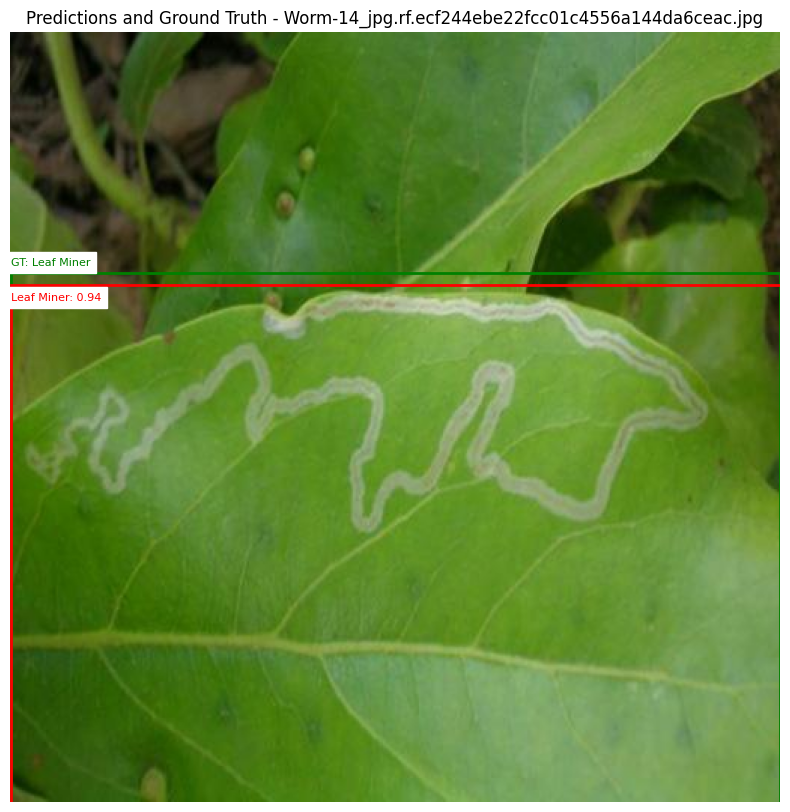


0: 512x512 1 Healthy, 2 Late Blights, 1 Leaf Miner, 1 Septoria, 28.8ms
Speed: 2.3ms preprocess, 28.8ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


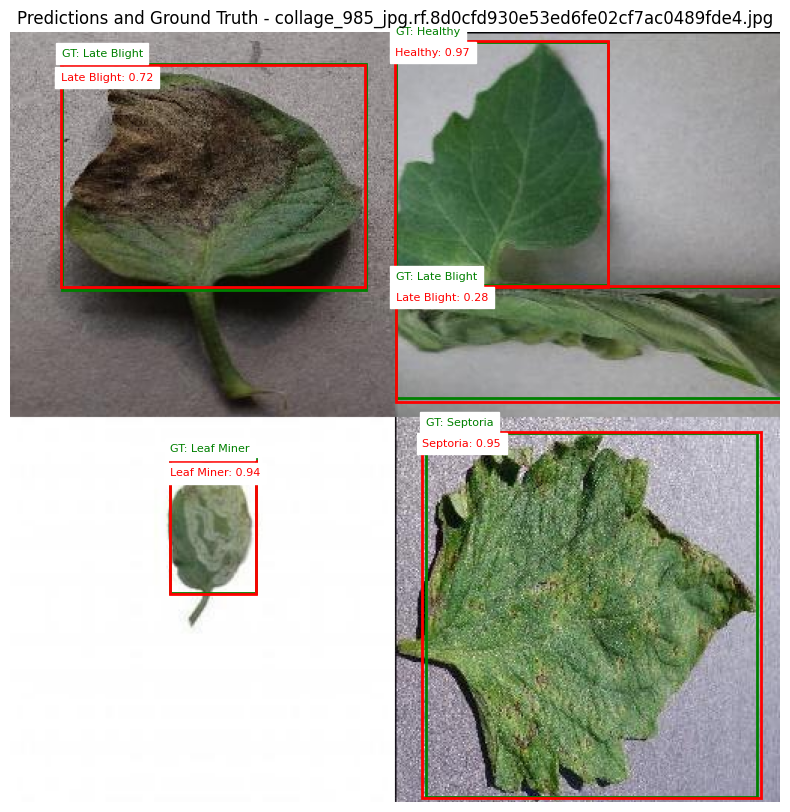


0: 512x512 1 Early Blight, 28.8ms
Speed: 1.7ms preprocess, 28.8ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


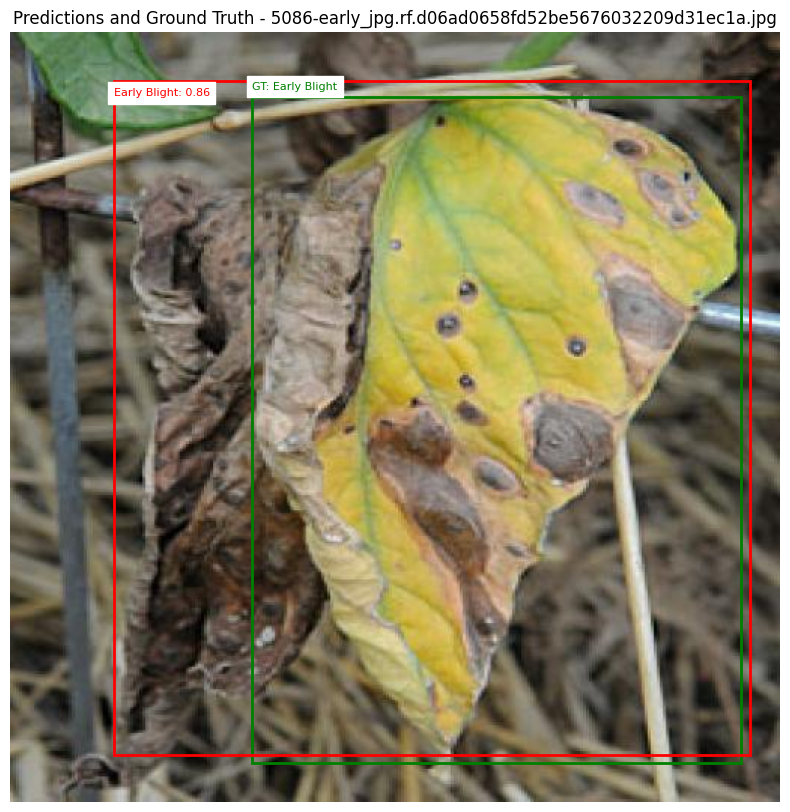


0: 512x512 2 Late Blights, 1 Mosaic Virus, 1 Septoria, 1 Spider Mites, 28.9ms
Speed: 1.9ms preprocess, 28.9ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 512)


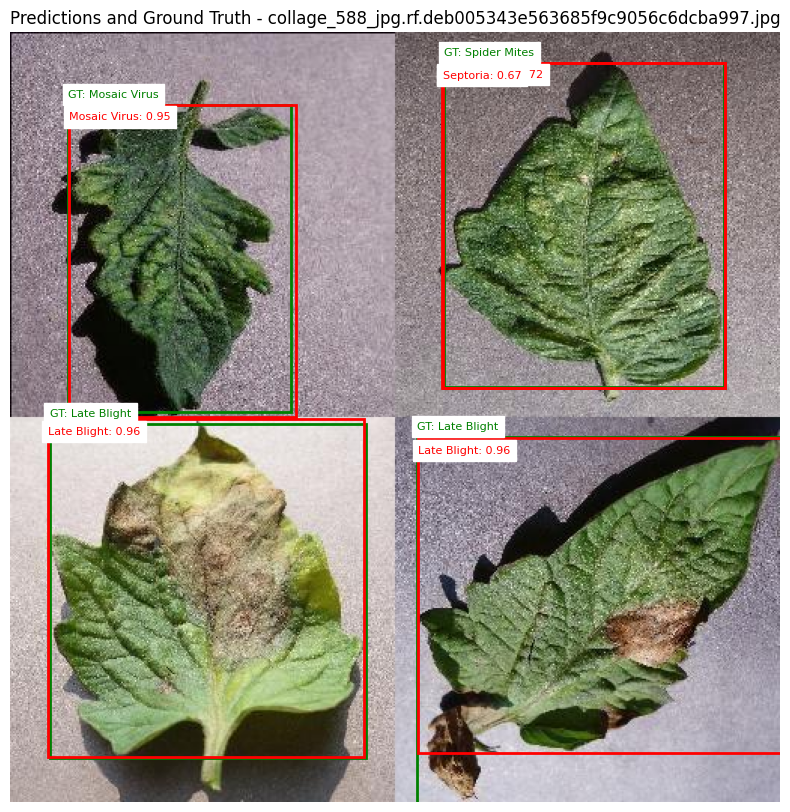


0: 512x512 1 Leaf Miner, 1 Leaf Mold, 1 Septoria, 1 Spider Mites, 28.8ms
Speed: 1.2ms preprocess, 28.8ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


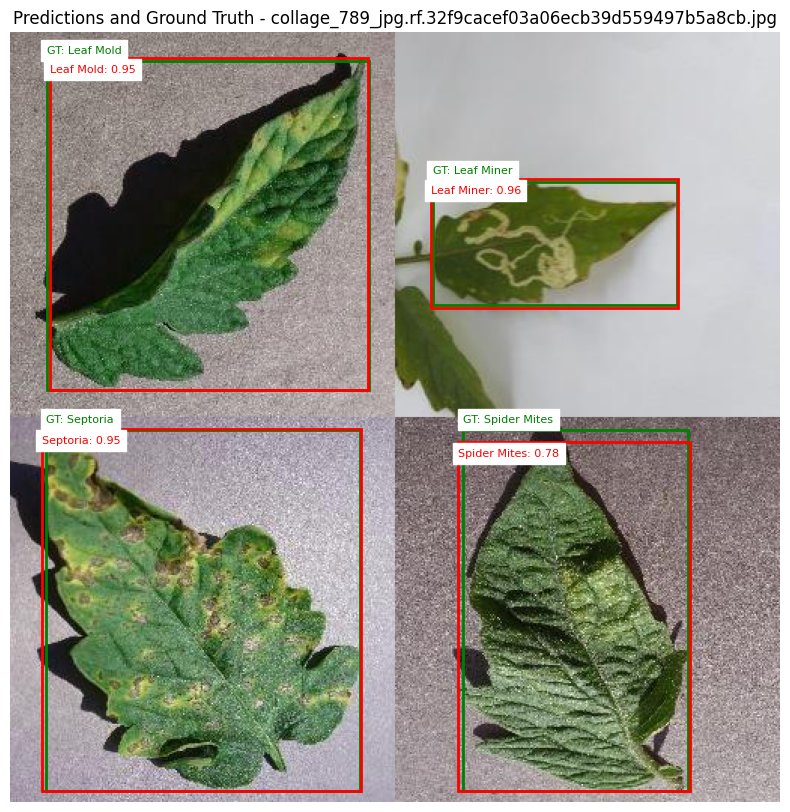


0: 512x512 2 Mosaic Viruss, 1 Septoria, 1 Yellow Leaf Curl Virus, 28.8ms
Speed: 1.7ms preprocess, 28.8ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


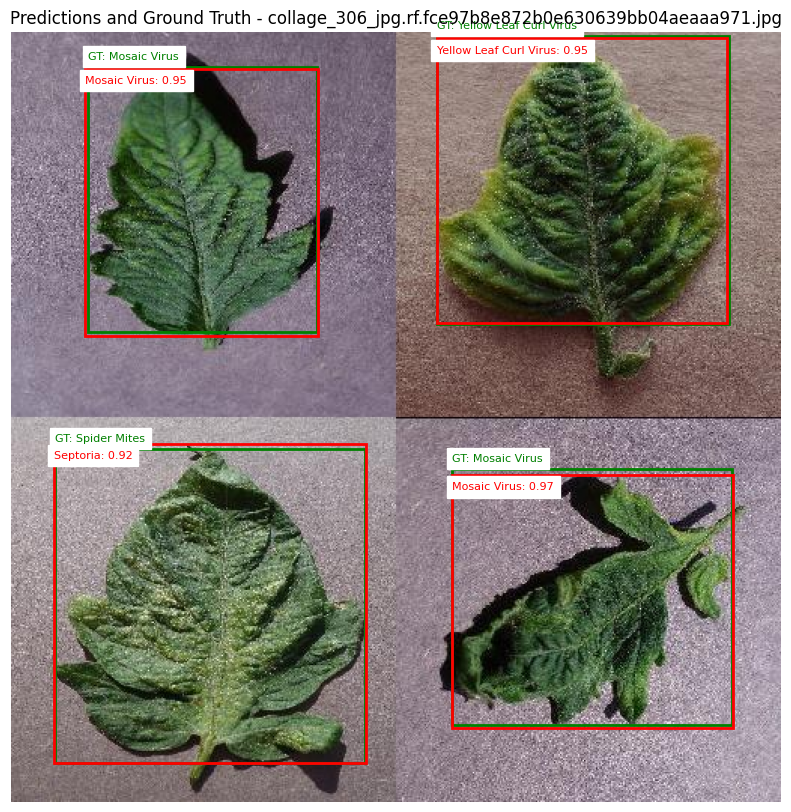


0: 512x512 1 Early Blight, 1 Mosaic Virus, 1 Septoria, 1 Spider Mites, 28.8ms
Speed: 1.4ms preprocess, 28.8ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


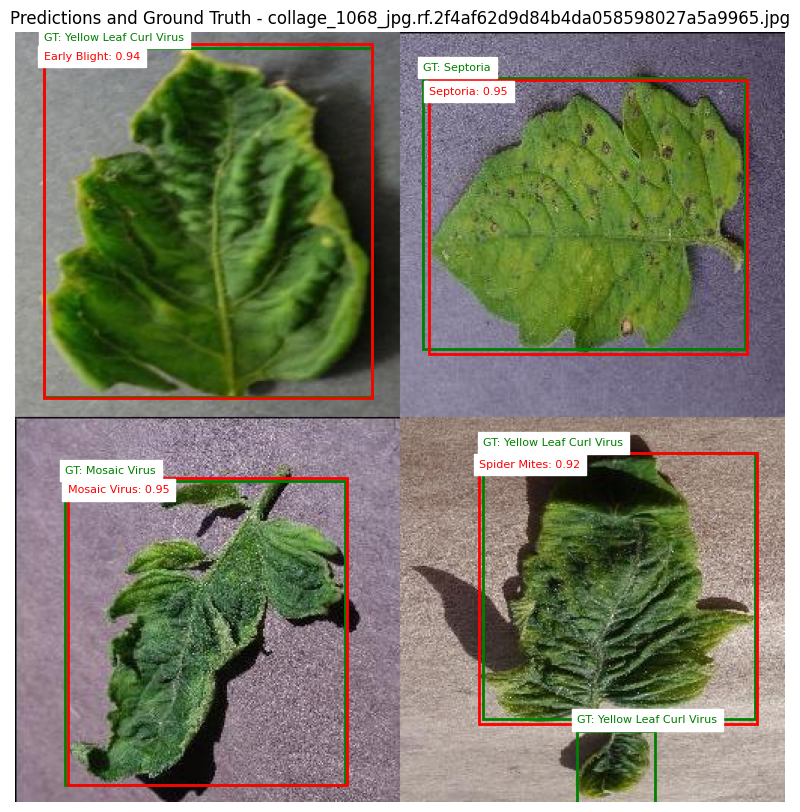


0: 512x512 1 Late Blight, 1 Leaf Miner, 1 Leaf Mold, 1 Spider Mites, 28.8ms
Speed: 1.7ms preprocess, 28.8ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


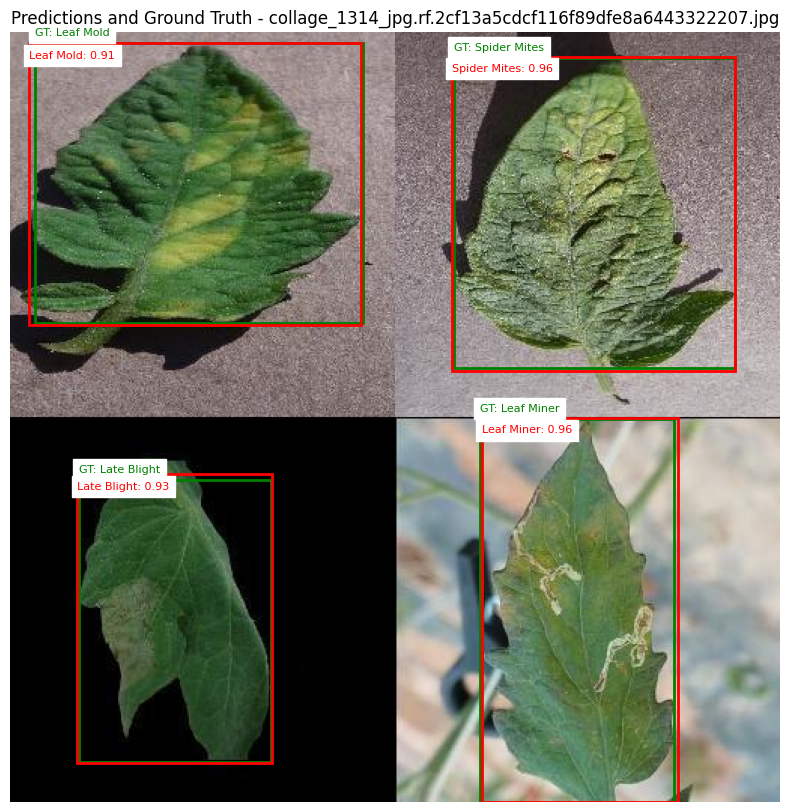


0: 512x512 2 Early Blights, 2 Late Blights, 1 Mosaic Virus, 1 Septoria, 28.8ms
Speed: 1.5ms preprocess, 28.8ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


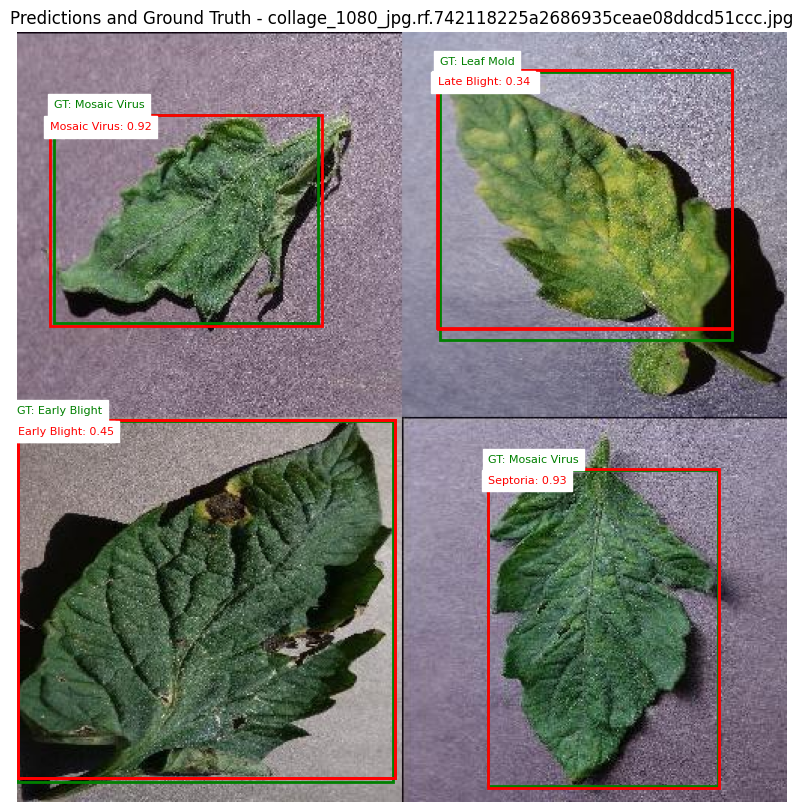


0: 512x512 1 Late Blight, 2 Mosaic Viruss, 1 Spider Mites, 28.8ms
Speed: 1.6ms preprocess, 28.8ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


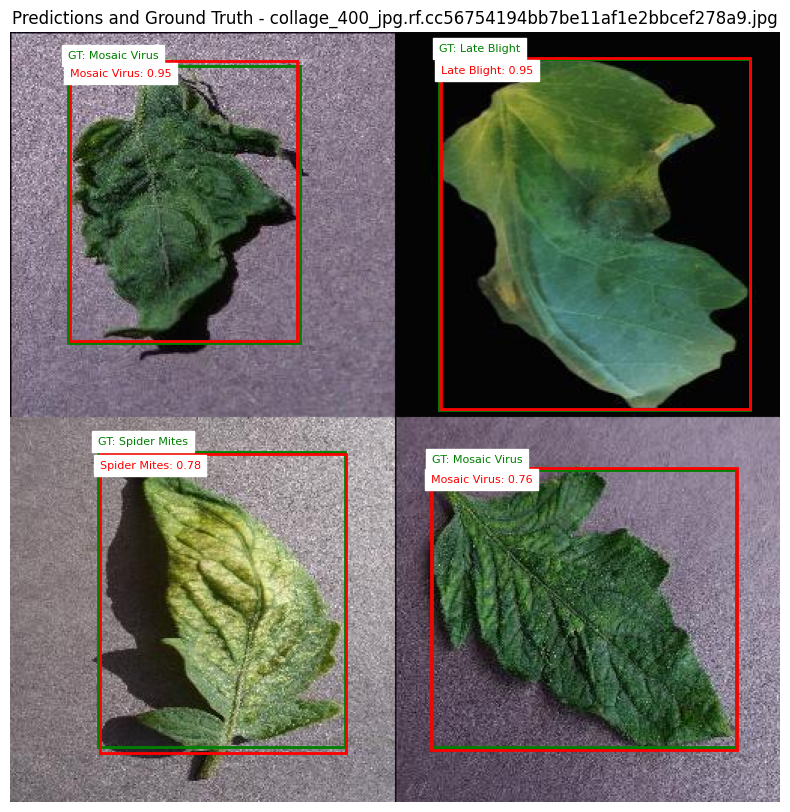

In [9]:
import os
import random
import cv2
import matplotlib.pyplot as plt
from pathlib import Path
from ultralytics import YOLO
import matplotlib.patches as patches

# Load the trained model
model = YOLO('/kaggle/working/runs/detect/tomato_disease_new_data_yolo12m/weights/best.pt')

# Path to test images and labels
test_images_dir = Path('/kaggle/working/Tomato-Leaf-Disease-63/test/images')
test_labels_dir = Path('/kaggle/working/Tomato-Leaf-Disease-63/test/labels')

# Get class names from the YAML
import yaml
with open('/kaggle/working/data_new.yaml', 'r') as f:
    class_names = yaml.safe_load(f)['names']

# Pick 10 random images
all_images = list(test_images_dir.glob('*.jpg'))
selected_images = random.sample(all_images, 10)

def load_ground_truth(image_path):
    label_path = test_labels_dir / (image_path.stem + '.txt')
    h, w = cv2.imread(str(image_path)).shape[:2]
    boxes = []
    if label_path.exists():
        with open(label_path, 'r') as f:
            for line in f.readlines():
                parts = line.strip().split()
                cls, xc, yc, bw, bh = map(float, parts)
                x1 = (xc - bw / 2) * w
                y1 = (yc - bh / 2) * h
                x2 = (xc + bw / 2) * w
                y2 = (yc + bh / 2) * h
                boxes.append((int(cls), x1, y1, x2, y2))
    return boxes

# Plotting function
def plot_image_with_predictions(image_path):
    img = cv2.imread(str(image_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]

    # Run prediction
    results = model(img_rgb)[0]

    # Plot
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    ax.imshow(img_rgb)
    ax.set_title(f'Predictions and Ground Truth - {image_path.name}')

    # Draw ground truth boxes
    gt_boxes = load_ground_truth(image_path)
    for cls, x1, y1, x2, y2 in gt_boxes:
        rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                 linewidth=2, edgecolor='green', facecolor='none')
        ax.add_patch(rect)
        ax.text(x1, y1 - 5, f"GT: {class_names[cls]}", color='green', fontsize=8, backgroundcolor='white')

    # Draw predicted boxes
    for box in results.boxes:
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
        conf = float(box.conf)
        cls = int(box.cls)
        rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                 linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        ax.text(x1, y1 + 10, f"{class_names[cls]}: {conf:.2f}", color='red', fontsize=8, backgroundcolor='white')

    plt.axis('off')
    plt.show()

# Run and plot for 10 images
for image_path in selected_images:
    plot_image_with_predictions(image_path)
